In [2]:
!pip install -q \
autodistill \
autodistill-grounded-sam \
autodistill-yolov8 \
roboflow \
supervision==0.9.0

In [33]:
import os
from autodistill.detection import CaptionOntology
from autodistill_grounded_sam import GroundedSAM
import supervision as sv
import zipfile
import os

def zip_folder(folder_path, zip_path):
    with zipfile.ZipFile(zip_path, 'w', zipfile.ZIP_DEFLATED) as zipf:
        for root, dirs, files in os.walk(folder_path):
            for file in files:
                zipf.write(os.path.join(root, file), os.path.relpath(os.path.join(root, file), folder_path))



def annotate(class_name,output_path, images_path, file_format='.jpg'):
    ontology=CaptionOntology({
    class_name: class_name,
})
    base_model = GroundedSAM(ontology=ontology)
    dataset = base_model.label(
     input_folder=images_path,
     extension=file_format,
     output_folder=output_path)
  
    ANNOTATIONS_DIRECTORY_PATH = f"{output_path}/train/labels"
    IMAGES_DIRECTORY_PATH = f"{output_path}/train/images"
    DATA_YAML_PATH = f"{output_path}/data.yaml"

    dataset = sv.DetectionDataset.from_yolo(
      images_directory_path=IMAGES_DIRECTORY_PATH,
      annotations_directory_path=ANNOTATIONS_DIRECTORY_PATH,
      data_yaml_path=DATA_YAML_PATH)

    SAMPLE_SIZE = 16
    SAMPLE_GRID_SIZE = (4, 4)
    SAMPLE_PLOT_SIZE = (16, 16)

    image_names = list(dataset.images.keys())[:SAMPLE_SIZE]

    mask_annotator = sv.MaskAnnotator()
    box_annotator = sv.BoxAnnotator()

    images = []
    for image_name in image_names:
        image = dataset.images[image_name]
        annotations = dataset.annotations[image_name]
        labels = [
          dataset.classes[class_id]
          for class_id
          in annotations.class_id]
        annotates_image = mask_annotator.annotate(
          scene=image.copy(),
          detections=annotations)
        annotates_image = box_annotator.annotate(
          scene=annotates_image,
          detections=annotations,
          labels=labels)
        images.append(annotates_image)

    sv.plot_images_grid(
      images=images,
      titles=image_names,
      grid_size=SAMPLE_GRID_SIZE,
      size=SAMPLE_PLOT_SIZE)

    zip_folder(output_path , f'{class_name}.zip')

trying to load grounding dino directly
final text_encoder_type: bert-base-uncased


Labeling /kaggle/input/animal-annotion/dataset/cows/OIP-ctmotJA2LJGHGKNLDDcYNgHaFD.jpeg:   0%|          | 0/54 [00:00<?, ?it/s]The `device` argument is deprecated and will be removed in v5 of Transformers.
torch.utils.checkpoint: please pass in use_reentrant=True or use_reentrant=False explicitly. The default value of use_reentrant will be updated to be False in the future. To maintain current behavior, pass use_reentrant=True. It is recommended that you use use_reentrant=False. Refer to docs for more details on the differences between the two variants.
None of the inputs have requires_grad=True. Gradients will be None
Labeling /kaggle/input/animal-annotion/dataset/cows/OIP-CFbGxDjWA7OQ7zxx5WnjOgHaKD.jpeg: 100%|██████████| 54/54 [01:20<00:00,  1.48s/it]


Labeled dataset created - ready for distillation.


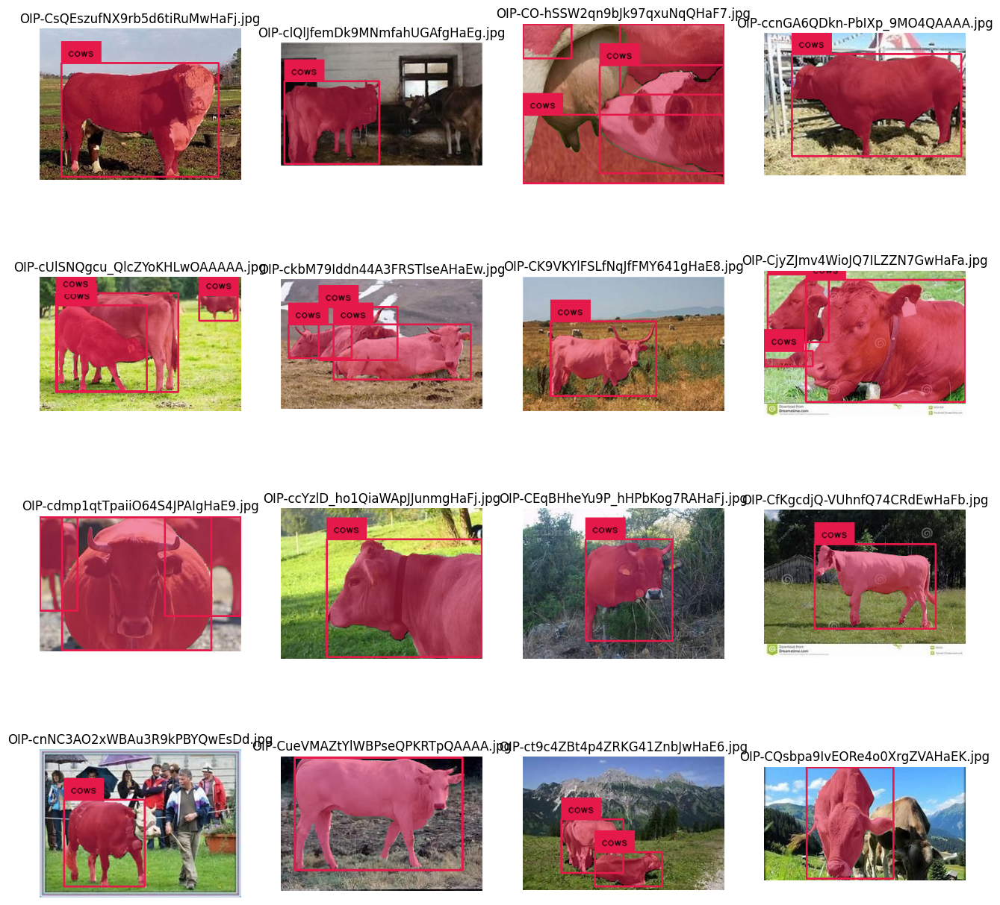

In [25]:
annotate('cows','/kaggle/working/cow_annotations',"/kaggle/input/animal-annotion/dataset/cows", file_format='.jpeg')

trying to load grounding dino directly
final text_encoder_type: bert-base-uncased


Labeling /kaggle/input/animal-annotion/dataset/donkey/donkey (467).jpg: 100%|██████████| 67/67 [01:34<00:00,  1.40s/it]


Labeled dataset created - ready for distillation.


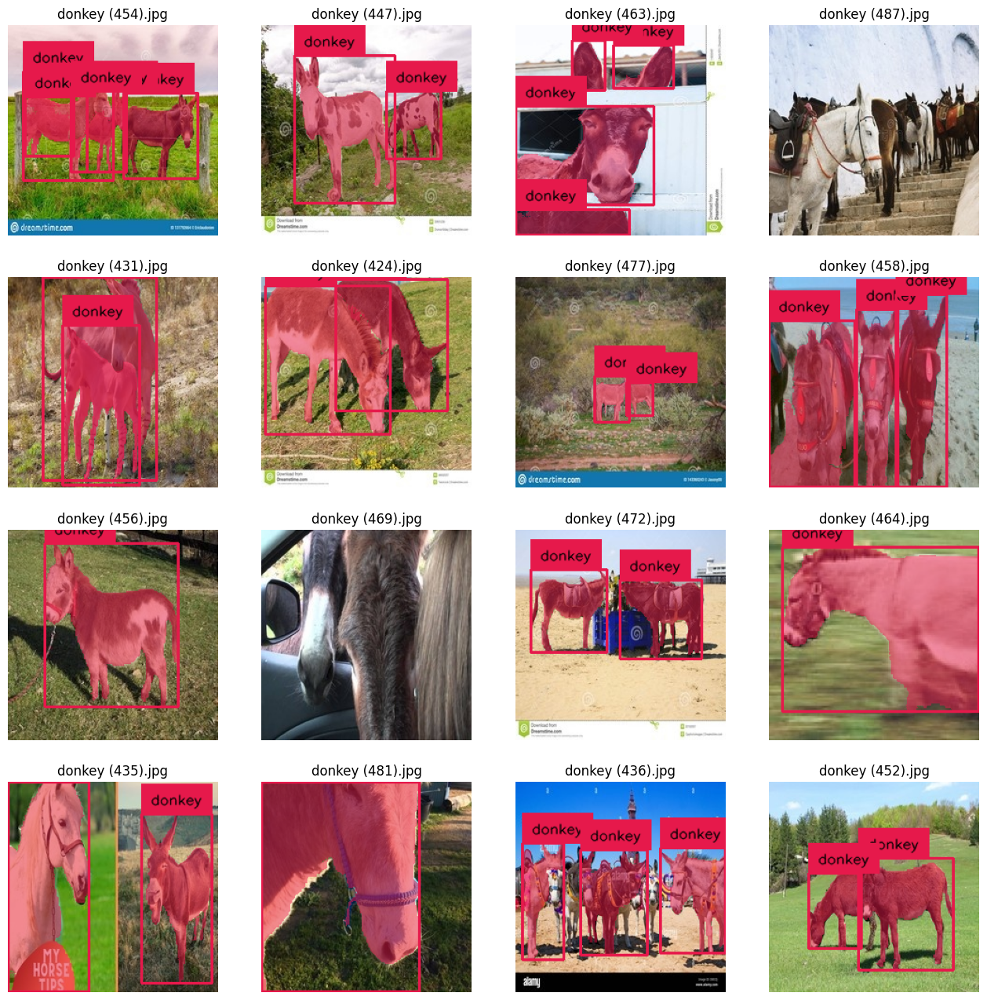

trying to load grounding dino directly
final text_encoder_type: bert-base-uncased


Labeling /kaggle/input/animal-annotion/dataset/dogs/dog.454.jpg: 100%|██████████| 58/58 [01:25<00:00,  1.47s/it]


Labeled dataset created - ready for distillation.


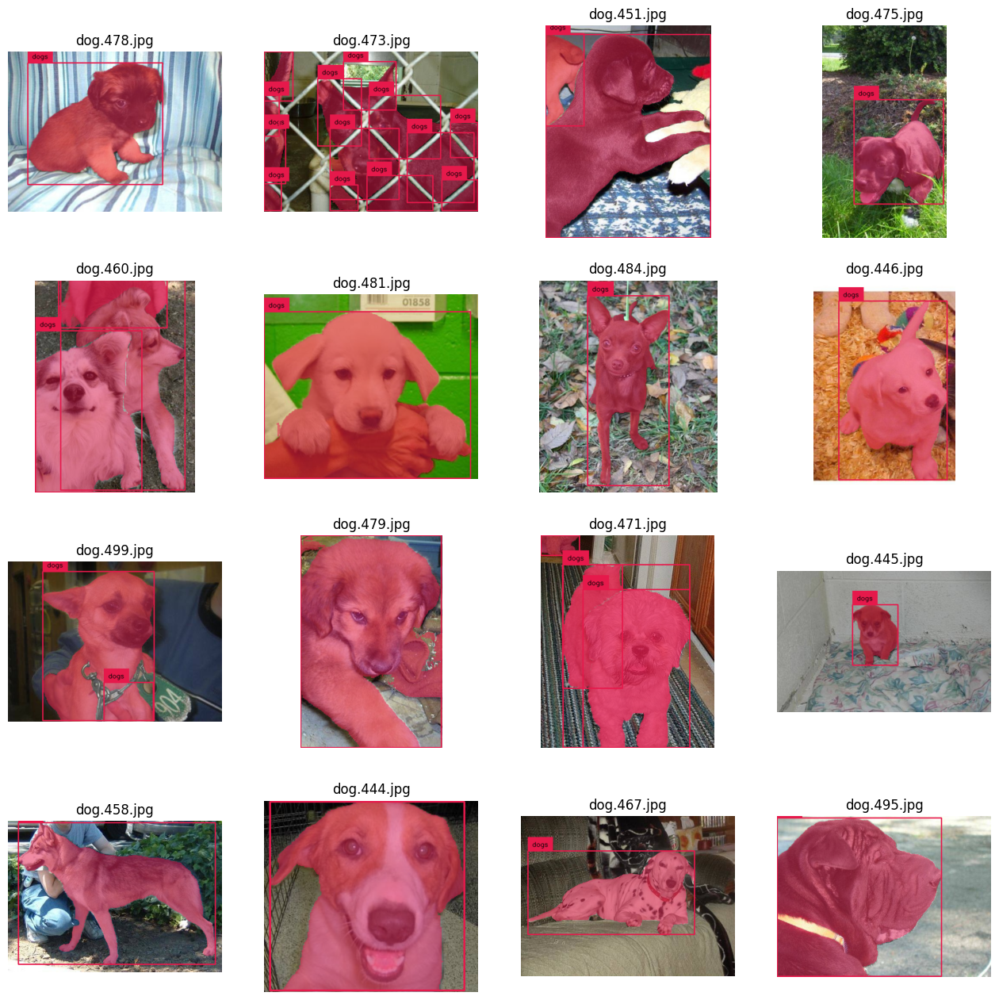

trying to load grounding dino directly
final text_encoder_type: bert-base-uncased


Labeling /kaggle/input/animal-annotion/dataset/horse/horse (25).jpeg: 100%|██████████| 70/70 [01:42<00:00,  1.47s/it]


Labeled dataset created - ready for distillation.


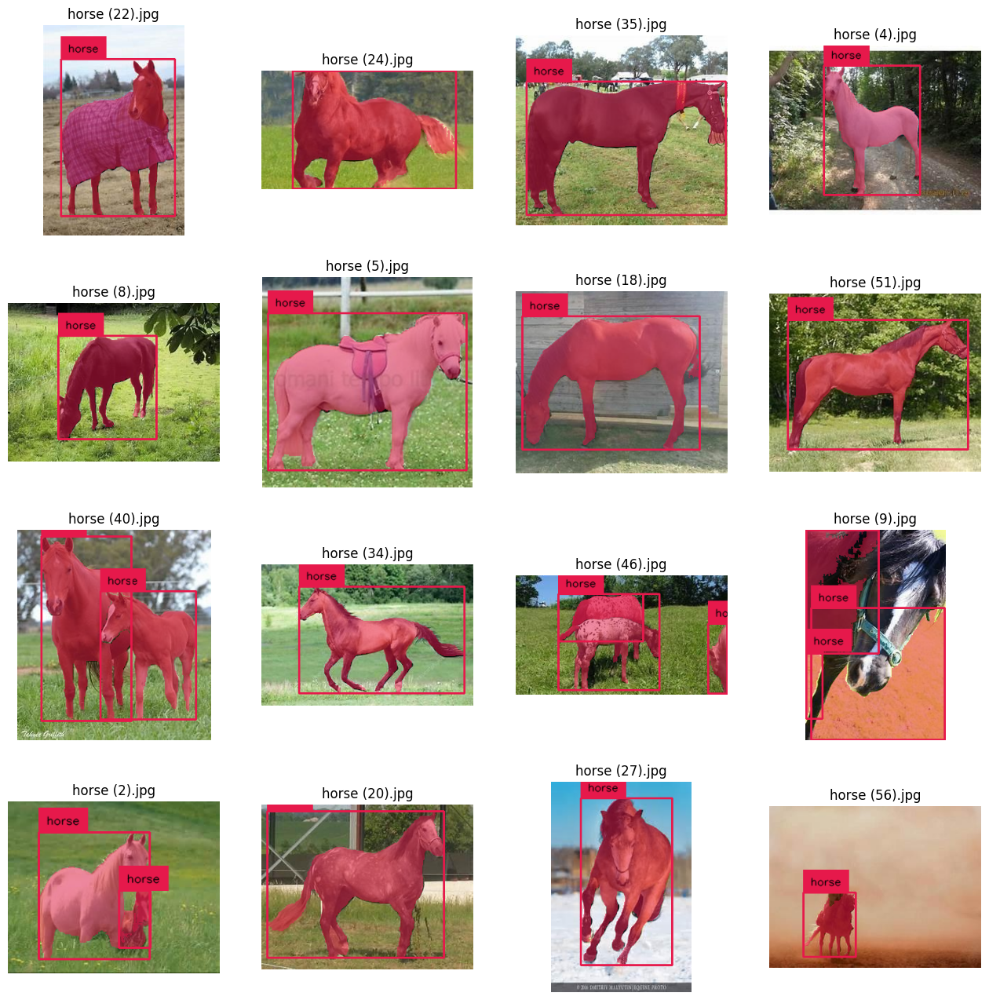

trying to load grounding dino directly
final text_encoder_type: bert-base-uncased


Labeling /kaggle/input/animal-annotion/dataset/goat/goat46.jpg: 100%|██████████| 50/50 [01:11<00:00,  1.44s/it]


Labeled dataset created - ready for distillation.


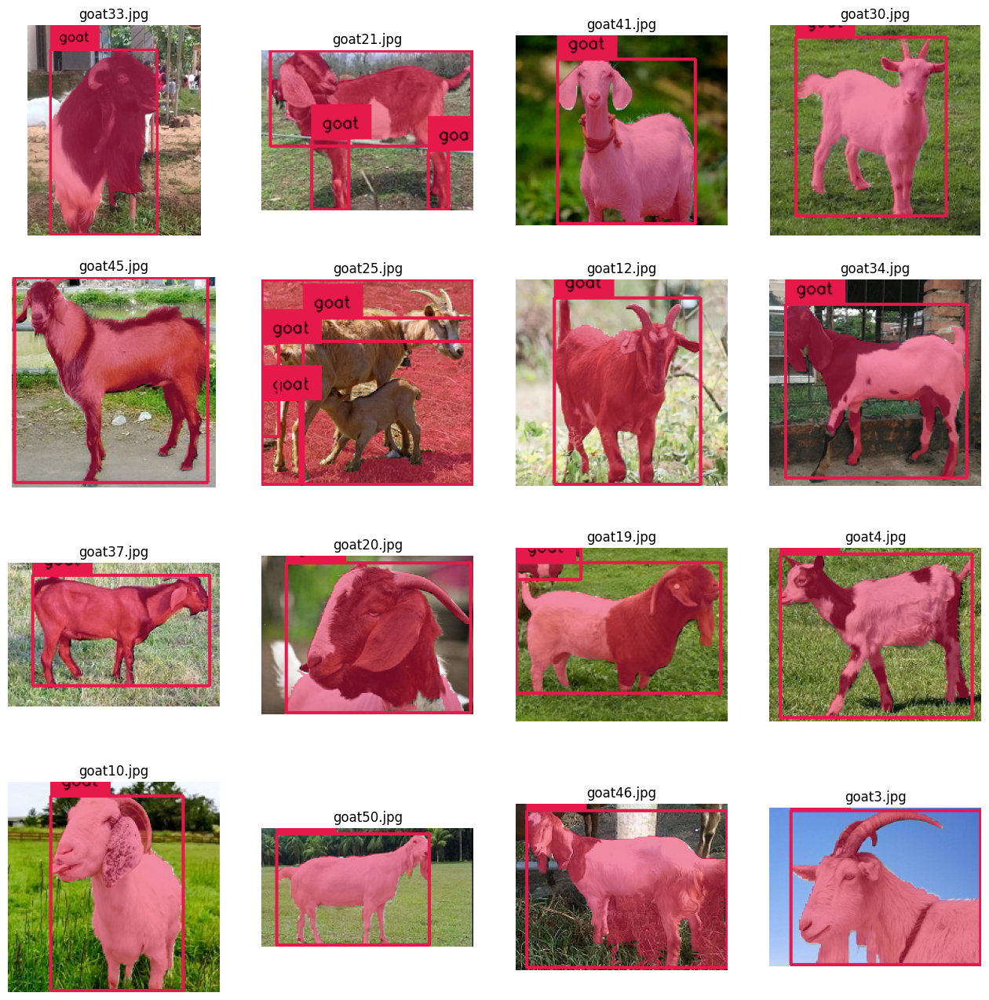

trying to load grounding dino directly
final text_encoder_type: bert-base-uncased


Labeling /kaggle/input/animal-annotion/dataset/chicken/chicken (3070).jpeg: 100%|██████████| 59/59 [01:27<00:00,  1.48s/it]


Labeled dataset created - ready for distillation.


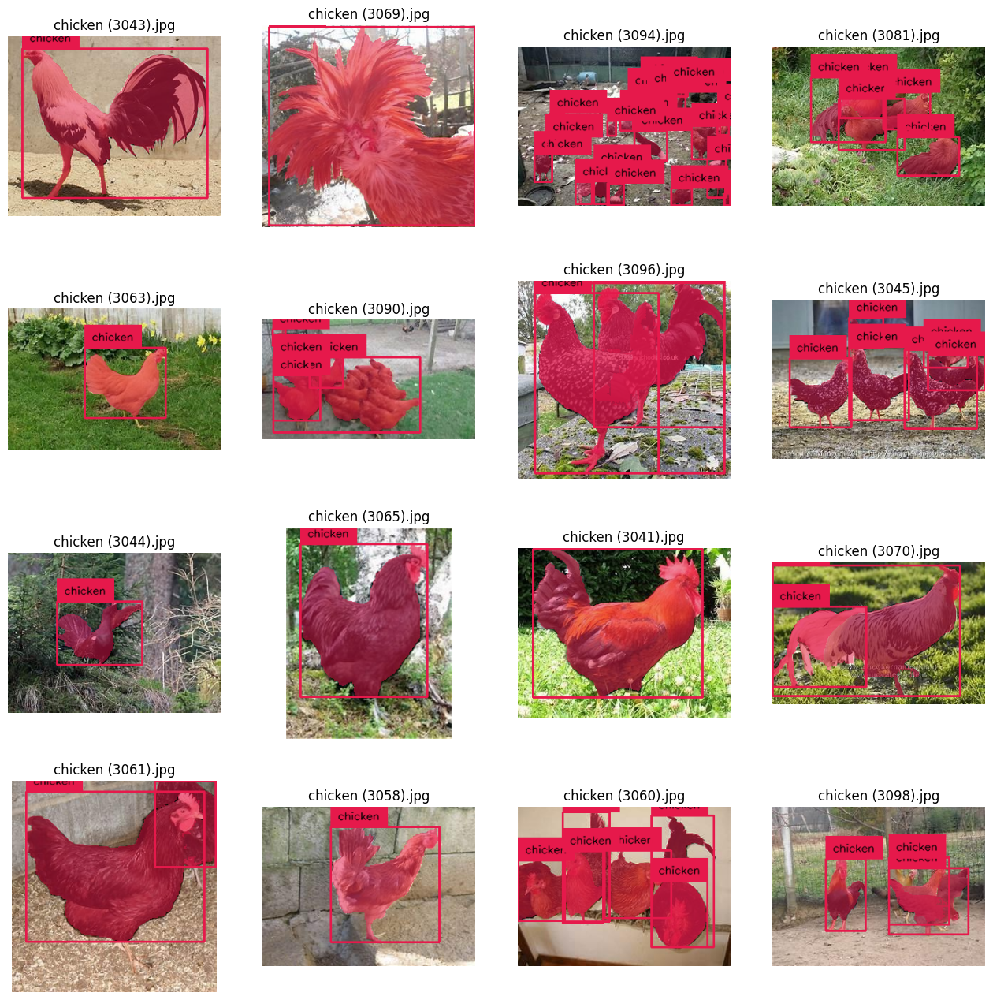

In [34]:
annotate('donkey','/kaggle/working/donkey',"/kaggle/input/animal-annotion/dataset/donkey", file_format='.jpg')
annotate('dogs','/kaggle/working/dogs',"/kaggle/input/animal-annotion/dataset/dogs", file_format='.jpg')
annotate('horse','/kaggle/working/horse',"/kaggle/input/animal-annotion/dataset/horse", file_format='.jpeg')
annotate('goat','/kaggle/working/goat',"/kaggle/input/animal-annotion/dataset/goat", file_format='.jpg')
annotate('chicken','/kaggle/working/chicken',"/kaggle/input/animal-annotion/dataset/chicken", file_format='.jpeg')
# annotate('cows','/kaggle/working/cow_annotations',"/kaggle/input/animal-annotion/dataset/sheep", file_format='.jpeg')

trying to load grounding dino directly
final text_encoder_type: bert-base-uncased


Labeling /kaggle/input/sheep-cl/images/sheep151.png: 100%|██████████| 63/63 [01:34<00:00,  1.49s/it]


Labeled dataset created - ready for distillation.


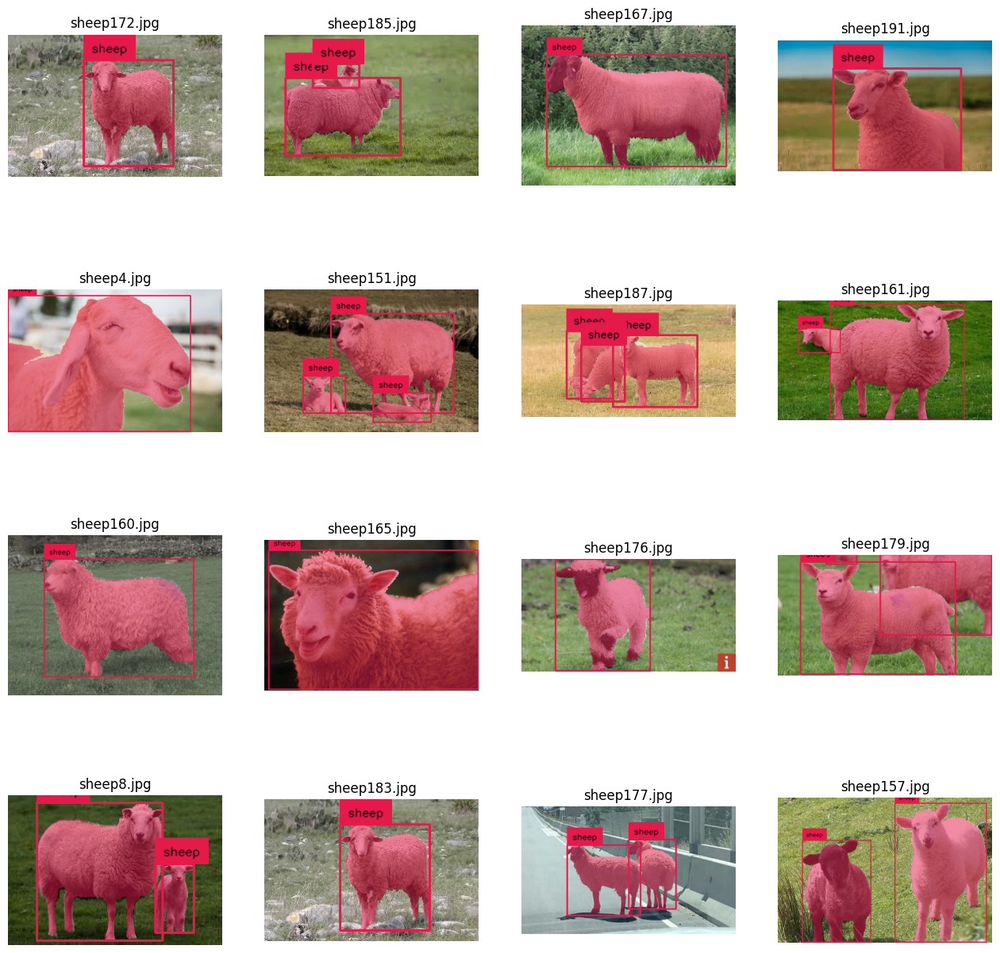

In [35]:
annotate('sheep','/kaggle/working/sheep',"/kaggle/input/sheep-cl/images", file_format='.png')